In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/early-detection-of-3d-printing-issues/sample_submission.csv
/kaggle/input/early-detection-of-3d-printing-issues/train.csv
/kaggle/input/early-detection-of-3d-printing-issues/test.csv
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580500.083077.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580752.783998.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580539.758166.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580391.966936.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580591.293364.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580419.931404.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580604.825959.jpg
/kaggle/input/early-detection-of-3d-printing-issues/images/101/1678580155/1678580437.550019.jpg
/kaggle/input/early-detection-of-3d

In [2]:
print(os.listdir('../input/early-detection-of-3d-printing-issues/'))

['sample_submission.csv', 'images', 'train.csv', 'test.csv']


In [3]:
main_dir = '../input/early-detection-of-3d-printing-issues/'
train_df = pd.read_csv("../input/early-detection-of-3d-printing-issues/train.csv")
test_df = pd.read_csv("../input/early-detection-of-3d-printing-issues/test.csv")
img_dir = os.path.join(main_dir, 'images/')

In [4]:
from numpy import asarray
import os
import pandas as pd
from skimage.io import imread, imshow
import matplotlib.pyplot as plt
%matplotlib inline

from PIL import Image



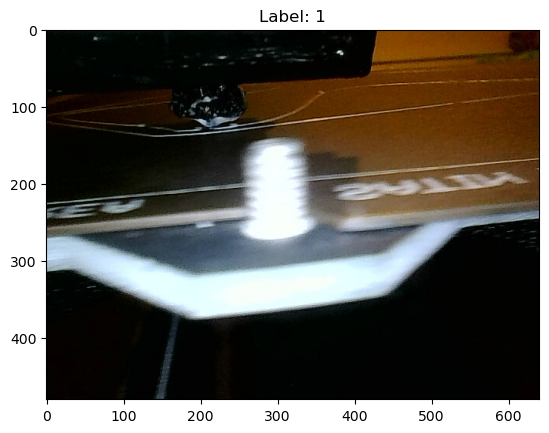

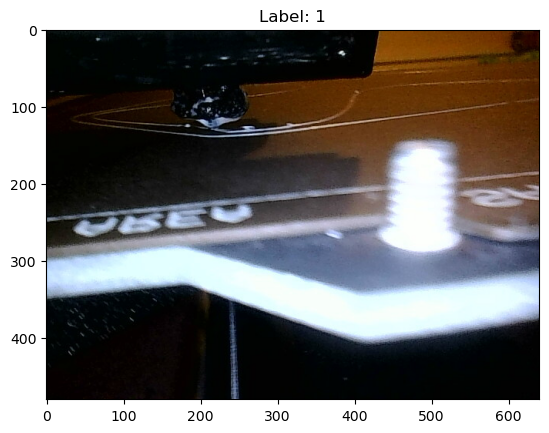

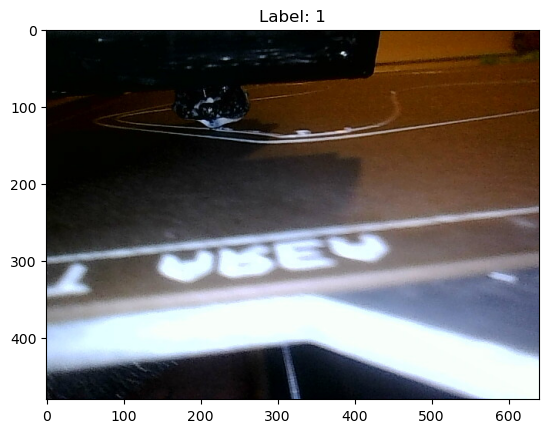

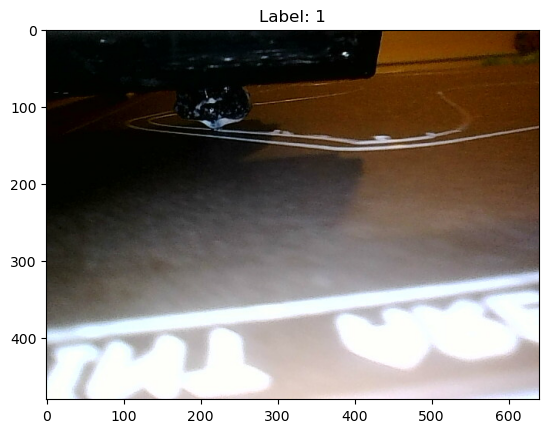

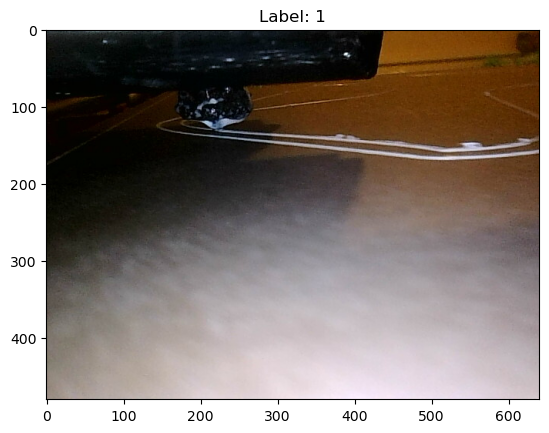

In [5]:
x = 0
for index, row in train_df.iterrows():
    image_path = img_dir + row['img_path']
    label = row['has_under_extrusion']
    x+=1
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(f"Label: {label}")
    plt.show()
    if  x == 5:
        break

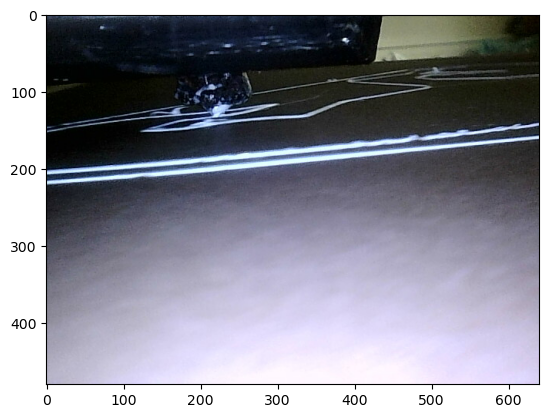

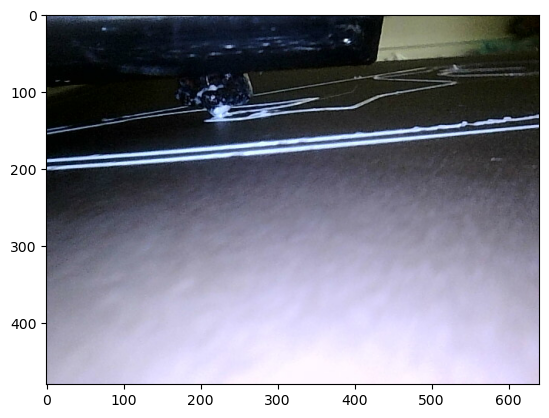

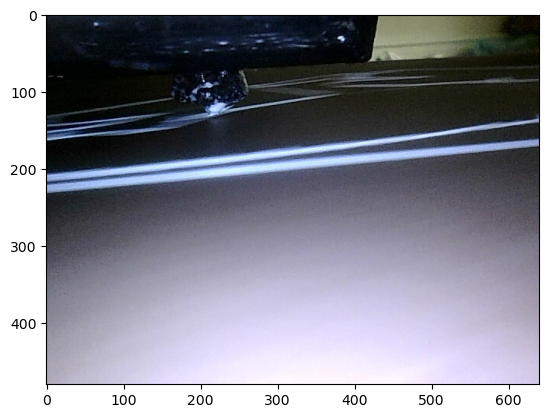

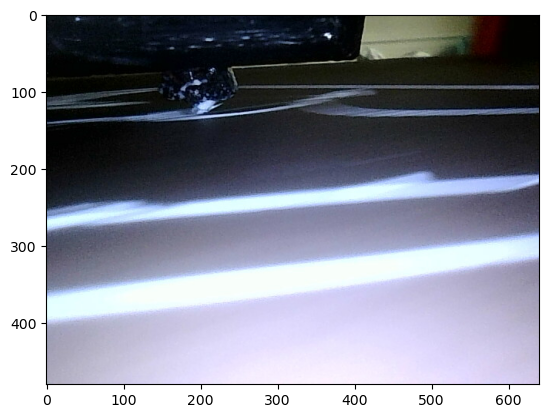

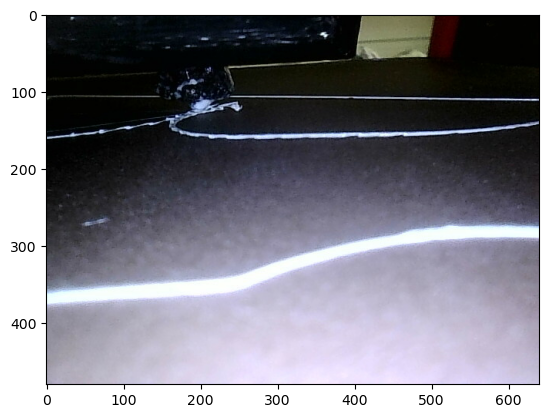

In [6]:
x = 0
for index, row in test_df.iterrows():
    image_path = img_dir + row['img_path']
#     label = row['has_under_extrusion']
    x+=1
    image = plt.imread(image_path)
    plt.imshow(image)
#     plt.title(f"Label: {label}")
    plt.show()
    if  x == 5:
        break

In [7]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from keras.preprocessing.image import ImageDataGenerator
from keras.layers import Dense, Activation, Flatten, Dropout
from keras.models import Sequential, Model 
from keras.optimizers import SGD, Adam
from keras.callbacks import TensorBoard
import keras

In [8]:
HEIGHT = 180
WIDTH = 180

BATCH_SIZE = 32
class_list = ["has_under_extrusion"]
FC_LAYERS = [1024, 512, 256]
dropout = 0.5



def build_model(base_model, dropout, fc_layers, num_classes):
    for layer in base_model.layers:
        layer.trainable = False

    x = base_model.output
    x = Flatten()(x)
    for fc in fc_layers:
        print(fc)
        x = Dense(fc, activation='relu')(x)
        x = Dropout(dropout)(x)
    preditions = Dense(num_classes, activation='softmax')(x)
    finetune_model = Model(inputs = base_model.input, outputs = preditions)
    return finetune_model

base_model_1 = ResNet50(weights = None,
                       include_top = False,
                       input_shape = (HEIGHT, WIDTH, 3))

In [9]:
train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input,
                                   rotation_range=90, 
                                     width_shift_range=0.5, 
                                     height_shift_range=0.5,
                                     shear_range=0.2,
                                     zoom_range=0.2,
                                     fill_mode='nearest',
                                     horizontal_flip=True, 
                                     validation_split=0.2)
# val_datagen = ImageDataGenerator(preprocessing_function = preprocess_input,
#                                   rotation_range = 90,
#                                   horizontal_flip = True,
#                                   vertical_flip = False,
#                                 )

In [10]:
# df = pd.DataFrame({'label': [0, 1, 0, 1]})

# one-hot encode the 'label' column
# one_hot_labels = pd.get_dummies(train_df['has_under_extrusion'])

# # replace the 'label' column with the one-hot encoded labels
# train_df = pd.concat([train_df.drop('has_under_extrusion', axis=1), one_hot_labels], axis=1)


In [11]:
train_df['has_under_extrusion'] = train_df['has_under_extrusion'].astype(str)

In [12]:
train_df.head()

,img_path,printer_id,print_id,has_under_extrusion
0,101/1678589738/1678589914.060332.jpg,101,1678589738,1
1,101/1678589738/1678589914.462857.jpg,101,1678589738,1
2,101/1678589738/1678589914.875075.jpg,101,1678589738,1
3,101/1678589738/1678589915.284495.jpg,101,1678589738,1
4,101/1678589738/1678589915.700486.jpg,101,1678589738,1


In [13]:
train_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory= img_dir,
    x_col='img_path',
    y_col='has_under_extrusion',
    target_size=(180, 180),
    batch_size=32,
    class_mode='binary',
    subset='training')

Found 64848 validated image filenames belonging to 2 classes.


In [14]:
val_generator = train_datagen.flow_from_dataframe(
    dataframe=train_df,
    directory=img_dir,
    x_col='img_path',
    y_col='has_under_extrusion',
    target_size=(180,180),
    batch_size=32,
    class_mode='binary',
    subset='validation')

Found 16212 validated image filenames belonging to 2 classes.


In [15]:
callbk = tf.keras.callbacks.EarlyStopping(monitor='acc',min_delta = 0.01, patience=5, verbose = 1, mode = max)

In [16]:
resnet50_model = build_model(base_model_1,
                                      dropout = dropout,
                                      fc_layers = FC_LAYERS,
                                      num_classes = len(class_list))
adam = Adam()
resnet50_model.compile(adam, loss="binary_crossentropy", metrics=["accuracy"])
resnet50_model.summary()

1024
512
256
Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 180, 180, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 186, 186, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 90, 90, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 90, 90, 64)   256         ['conv1_conv[0][

In [17]:
hist = resnet50_model.fit(
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=15,
    validation_data=val_generator,
    validation_steps=val_generator.samples // val_generator.batch_size,
    callbacks = [callbk]
) 

Epoch 1/15
2026/2026 [==============================] - 1852s 910ms/step - loss: 5.2132 - accuracy: 0.5330 - val_loss: 0.6833 - val_accuracy: 0.6034
Epoch 2/15
2026/2026 [==============================] - 1593s 786ms/step - loss: 0.6986 - accuracy: 0.5329 - val_loss: 0.6837 - val_accuracy: 0.6035
Epoch 3/15
2026/2026 [==============================] - 1599s 789ms/step - loss: 0.6990 - accuracy: 0.5329 - val_loss: 0.6822 - val_accuracy: 0.6037
Epoch 4/15
2026/2026 [==============================] - 1519s 749ms/step - loss: 0.6911 - accuracy: 0.5328 - val_loss: 0.6818 - val_accuracy: 0.6036
Epoch 5/15
2026/2026 [==============================] - 1559s 770ms/step - loss: 0.7002 - accuracy: 0.5329 - val_loss: 0.6806 - val_accuracy: 0.6037
Epoch 6/15
2026/2026 [==============================] - 1580s 780ms/step - loss: 0.6939 - accuracy: 0.5328 - val_loss: 0.6821 - val_accuracy: 0.6037
Epoch 7/15
2026/2026 [==============================] - 1452s 716ms/step - loss: 0.6912 - accuracy: 0.5329

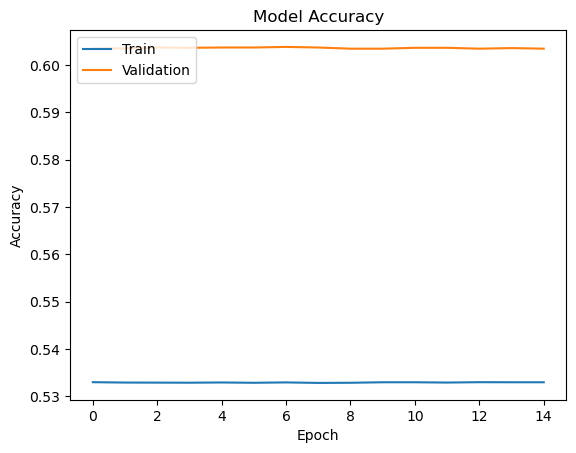

In [18]:
plt.plot(hist.history['accuracy'])
plt.plot(hist.history['val_accuracy'])
plt.title('Model Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()

In [19]:
test_datagen = ImageDataGenerator(preprocessing_function = preprocess_input,
                                  rotation_range = 90,
                                  horizontal_flip = True,
                                  vertical_flip = False)
test_generator = test_datagen.flow_from_dataframe(
                            dataframe = test_df,
                            directory = img_dir,
                            x_col = 'img_path',
                            target_size = (180,180),
                            batch_size = 32,
                            shuffle = False,
                            class_mode = None
)

Found 25279 validated image filenames.


In [20]:
predictions = resnet50_model.predict(test_generator) 

790/790 [==============================] - 578s 730ms/step


In [21]:
predictions[0:5]

array([[1.],
       [1.],
       [1.],
       [1.],
       [1.]], dtype=float32)

In [22]:
thresh = 0.5
final = [1 if i > thresh else 0 for i in predictions]
final[0:5]

[1, 1, 1, 1, 1]

In [23]:
test_df['has_under_extrusion'] = final

In [24]:
my_submission = test_df.copy()
my_submission = my_submission.drop(columns=['print_id', 'printer_id'])
my_submission.to_csv("submission.csv", index = False)

In [25]:
my_submission.head()

,img_path,has_under_extrusion
0,101/1678578332/1678578538.704966.jpg,1
1,101/1678578332/1678578539.108019.jpg,1
2,101/1678578332/1678578539.512872.jpg,1
3,101/1678578332/1678578539.916711.jpg,1
4,101/1678578332/1678578540.329089.jpg,1
